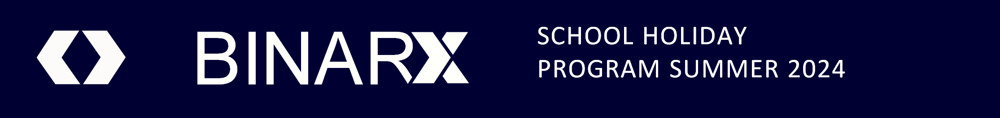

In [1]:
#Here is some code for importing different python libraries.
import pandas as pd
import matplotlib.pyplot as plt
# If this import doesnt work use pip install plotly.express pandas on your command line
import plotly.express as px

Read in the file of data from your rocket payload.

In [3]:
# Replace 'Sample Data.csv.csv' with the actual path to your CSV file
file_dir = 'C:/Users/285227D/Documents/EL/Python/BinarX/'
file_path = "Sample Data.csv"
#file_path = "Sample Data.csv" #Replace this with the file name/path of your data.

# Read CSV file into a DataFrame
payload = pd.read_csv(file_path)

# Display the DataFrame
payload


,X,Y,Z,TIME
0,1994.0,2152.0,1984.0,1
1,1995.0,2043.0,2019.0,2
2,1998.0,2043.0,2015.0,3
3,1995.0,2042.0,2019.0,4
4,1995.0,2042.0,2015.0,5
...,...,...,...,...
87465,1970.0,1993.0,2073.0,87466
87466,NaN,NaN,NaN,87467
87467,NaN,NaN,NaN,87468
87468,NaN,NaN,NaN,87469


In [4]:
payload.head() # Display quick preview of the data

,X,Y,Z,TIME
0,1994.0,2152.0,1984.0,1
1,1995.0,2043.0,2019.0,2
2,1998.0,2043.0,2015.0,3
3,1995.0,2042.0,2019.0,4
4,1995.0,2042.0,2015.0,5


In [5]:
#Conversion from ticks to seconds (1/20MHz *Tick = Seconds)
def convert(x):
    x = x * 1644 / (20*10**6) #Assuming a frequendata2Convert = payload['TIME']
    return x

data2Convert = payload['TIME']
convertedData = data2Convert.apply(convert) #Takes the time column and applys the convert function to it
payload['SECONDS'] = convertedData #Replaces original data with the new data.cy of 20 MHz, if your sensor has a different frequency change this
   


payload

,X,Y,Z,TIME,SECONDS
0,1994.0,2152.0,1984.0,1,0.000082
1,1995.0,2043.0,2019.0,2,0.000164
2,1998.0,2043.0,2015.0,3,0.000247
3,1995.0,2042.0,2019.0,4,0.000329
4,1995.0,2042.0,2015.0,5,0.000411
...,...,...,...,...,...
87465,1970.0,1993.0,2073.0,87466,7.189705
87466,NaN,NaN,NaN,87467,7.189787
87467,NaN,NaN,NaN,87468,7.189870
87468,NaN,NaN,NaN,87469,7.189952


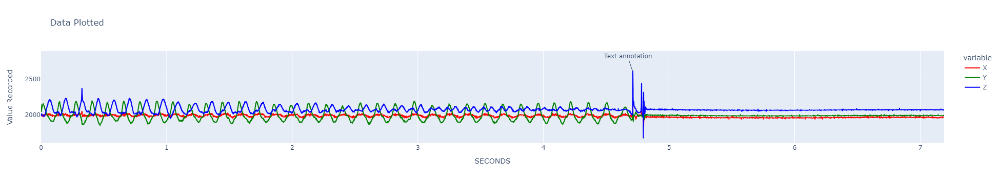

In [6]:
dataSeries = ['X','Y','Z']
fig = px.line(payload, x='SECONDS', y=dataSeries,
              color_discrete_sequence=["red", "green", "blue"], #Change colors to desired or replace with hexadecimal
              labels=dict(TICKS="Total Time (Seconds)",value="Value Recorded"),#Allows you to change the plot axis labels
              title='Data Plotted') #Changes the title

fig.add_annotation(x = 4.71,y=2606,text="Text annotation")#Sets a data annotation : find the point from either the CSV or the graph
fig.show()